In [1]:
# Importing required libraries
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Importing TensorFlow and its components
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

# Importing utility functions from TensorFlow and other libraries
import tensorflow.keras.utils as keras_utils
import pydotplus
import graphviz

# Importing scikit-learn for data splitting and evaluation
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

In [4]:

# Define the path to your training directory
train_dir = 'F://experiments of 24 may//dataset june//train'

In [5]:

# Constants for image and model configurations
image_width, image_height = 150, 150
batch_size = 32
epochs = 50


In [6]:
# Create a list of image file paths and their corresponding labels
image_paths = []
labels = []
class_names = os.listdir(train_dir)
for label, class_name in enumerate(class_names):
    class_dir = os.path.join(train_dir, class_name)
    for image_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, image_name))
        labels.append(class_name)

# Split the data into training and validation sets
train_paths, val_paths, train_labels, val_labels = train_test_split(image_paths, labels, test_size=0.2, random_state=42)

# Create data generators with image augmentation for training and validation sets
train_datagen = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)
val_datagen = ImageDataGenerator(rescale=1./255)

# Define the flow_from_directory data generators for training and validation
train_generator = train_datagen.flow_from_dataframe(dataframe=pd.DataFrame({'image_paths': train_paths, 'labels': train_labels}),
                                                    directory=train_dir,
                                                    x_col='image_paths',
                                                    y_col='labels',
                                                    target_size=(image_width, image_height),
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    shuffle=True,
                                                    seed=42)

val_generator = val_datagen.flow_from_dataframe(dataframe=pd.DataFrame({'image_paths': val_paths, 'labels': val_labels}),
                                                directory=train_dir,
                                                x_col='image_paths',
                                                y_col='labels',
                                                target_size=(image_width, image_height),
                                                batch_size=batch_size,
                                                class_mode='categorical',
                                                shuffle=False,
                                                seed=42)

Found 570 validated image filenames belonging to 4 classes.
Found 143 validated image filenames belonging to 4 classes.


In [7]:
# Extract class labels from the directory names
class_labels = sorted(os.listdir(train_dir))

In [8]:
# Create the CNN model architecture
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(image_width, image_height, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(len(class_labels), activation='softmax'))

In [9]:
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
flatten (Flatten)            (None, 36992)             0

In [1]:
#plot model
plot_model(model, to_file='model_architecture.png', show_shapes=True, expand_nested=True)


NameError: name 'plot_model' is not defined

In [10]:
# Train the model
history = model.fit(train_generator, steps_per_epoch=len(train_generator), epochs=epochs,
                    validation_data=val_generator, validation_steps=len(val_generator))

Epoch 1/50
18/18 [==============================] - 182s 4s/step - loss: 1.6032 - accuracy: 0.3105 - val_loss: 1.1022 - val_accuracy: 0.5385
Epoch 2/50
18/18 [==============================] - 41s 2s/step - loss: 0.7673 - accuracy: 0.6825 - val_loss: 0.4527 - val_accuracy: 0.7832
Epoch 3/50
18/18 [==============================] - 38s 2s/step - loss: 0.5175 - accuracy: 0.7351 - val_loss: 0.4293 - val_accuracy: 0.7972
Epoch 4/50
18/18 [==============================] - 27s 1s/step - loss: 0.5063 - accuracy: 0.7596 - val_loss: 0.5117 - val_accuracy: 0.7832
Epoch 5/50
18/18 [==============================] - 26s 1s/step - loss: 0.5712 - accuracy: 0.7298 - val_loss: 0.7417 - val_accuracy: 0.6364
Epoch 6/50
18/18 [==============================] - 27s 2s/step - loss: 0.5286 - accuracy: 0.7474 - val_loss: 0.4523 - val_accuracy: 0.7552
Epoch 7/50
18/18 [==============================] - 26s 1s/step - loss: 0.4629 - accuracy: 0.7825 - val_loss: 0.6325 - val_accuracy: 0.6434
Epoch 8/50
18/18 [=

In [27]:
#Print Validation Loss and Validation Accuracy
val_loss, val_accuracy = model.evaluate(val_generator, steps=len(val_generator))
print(f'Validation Loss: {val_loss:.4f}')
print(f'Validation Accuracy: {val_accuracy:.4f}')

5/5 [==============================] - 8s 2s/step - loss: 0.1442 - accuracy: 0.9510
Validation Loss: 0.1442
Validation Accuracy: 0.9510


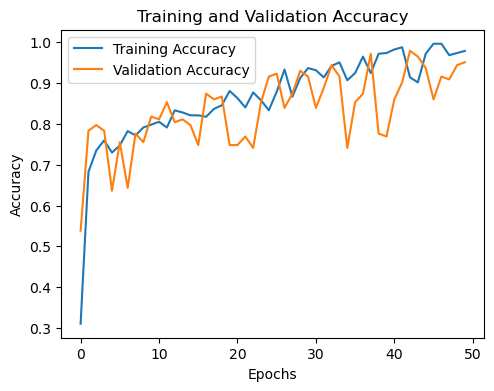

In [11]:
# Plot accuracy and loss curves
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

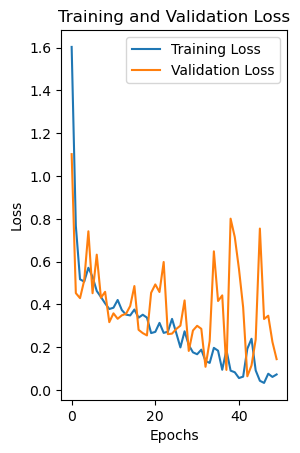

In [12]:
#plot training and validation loss graph
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

In [13]:
plt.tight_layout()
plt.show()


<Figure size 640x480 with 0 Axes>

In [32]:

# Define the path to your test directory
test_dir = 'F://experiments of 24 may//dataset 67//dataset 2//test'

In [57]:
# Create the test data generator
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(test_dir, target_size=(image_width, image_height),
                                                  batch_size=1, class_mode=None, shuffle=False)

Found 38 images belonging to 4 classes.


In [58]:
# Predict the classes for the test set
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_generator.classes


In [59]:

# Calculate the test accuracy
test_accuracy = np.mean(predicted_classes == true_classes)
print(f'Test Accuracy: {test_accuracy:.4f}')

Test Accuracy: 0.9474


In [47]:
# Create a list of test image file paths and their corresponding labels
test_image_paths = []
test_labels = []
class_names = os.listdir(train_dir)
for class_name in class_names:
    class_dir = os.path.join(test_dir, class_name)
    for image_name in os.listdir(class_dir):
        test_image_paths.append(os.path.join(class_dir, image_name))
        test_labels.append(class_name)

In [48]:
# Create the test data generator
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(dataframe=pd.DataFrame({'image_paths': test_image_paths, 'labels': test_labels}),
                                                  directory=test_dir,
                                                  x_col='image_paths',
                                                  y_col='labels',
                                                  target_size=(image_width, image_height),
                                                  batch_size=1,
                                                  class_mode=None,
                                                  shuffle=False)

Found 38 validated image filenames.


In [45]:
# Extracting the true class labels from the test generator
true_classes = test_generator.classes

# Generating a list of class labels using the keys from the training generator's class indices
class_labels = list(train_generator.class_indices.keys())


In [36]:
# Generating predictions for the test dataset using the trained model
predictions = model.predict(test_generator)

# Extracting the predicted classes by finding the index of the maximum value in each prediction
predicted_classes = np.argmax(predictions, axis=1)


In [37]:
# Print classification report and confusion matrix
print('Classification Report:')
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


Classification Report:
              precision    recall  f1-score   support

           a       1.00      0.80      0.89        10
           b       1.00      1.00      1.00        10
           c       0.83      1.00      0.91        10
           d       1.00      1.00      1.00         8

    accuracy                           0.95        38
   macro avg       0.96      0.95      0.95        38
weighted avg       0.96      0.95      0.95        38



In [ ]:
#Description of class names


#Class a: banana fields
#Class b: grape fields
#Class c: sugarcane fields
#Class d: pathways through farm fields

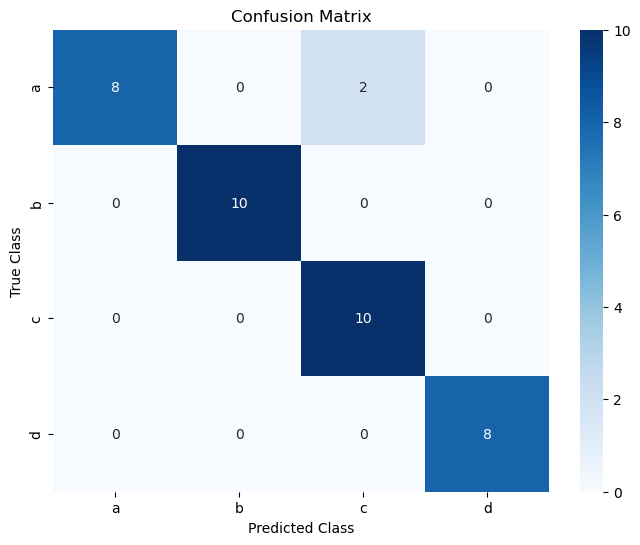

In [39]:
# Calculating the confusion matrix based on true classes and predicted classes
confusion_mat = confusion_matrix(true_classes, predicted_classes)

# Creating a heatmap visualization of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)

# Adding title and axis labels to the heatmap
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class')
plt.ylabel('True Class')

# Displaying the heatmap
plt.show()


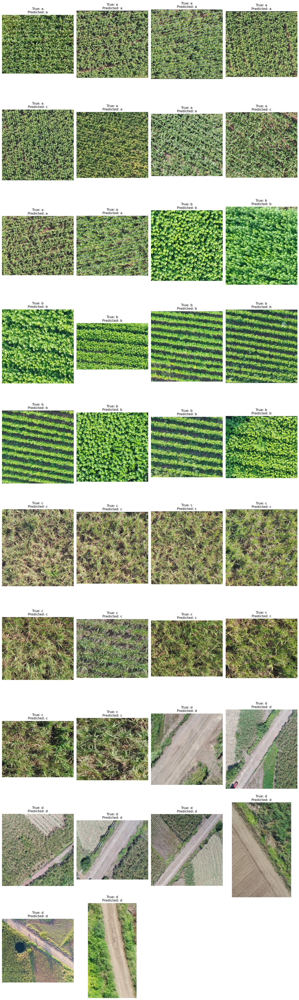

In [41]:
# Display test images with true class and predicted class
num_images = len(true_classes)
num_rows = int(np.ceil(num_images / 4))
plt.figure(figsize=(15, 5 * num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 4, i + 1)
    img = plt.imread(test_generator.filepaths[i])
    plt.imshow(img)
    plt.title(f'True: {class_labels[true_classes[i]]}\nPredicted: {class_labels[predicted_classes[i]]}')
    plt.axis('off')

plt.tight_layout()
plt.show()